<a href="https://colab.research.google.com/github/sushma-snk/Cat-Dog_prediction/blob/main/CatDog_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


1. Import required libraries

In [108]:
import os
import cv2
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

import tensorflow as tf
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, BatchNormalization, Flatten, Dense, Dropout

import json
from keras.models import model_from_json
import keras.utils as image
# from keras.preprocessing import image

from warnings import filterwarnings
filterwarnings('ignore')

2. Load the dataset train and test data and visualize training dataset using matplotlib

In [3]:
training_data_path = '/gdrive/My Drive/unikaksha/mini_projects/Cat&Dog_Prediction/training_set/'
testing_data_path = '/gdrive/My Drive/unikaksha/mini_projects/Cat&Dog_Prediction/test_set/'

In [122]:
def data_visualization(folder_path, category):
    data_path = folder_path
    label = None
    if category == 0:
        data_path = data_path + "/" + "cats"
        label = 0
    else:
        data_path = data_path + "/" + "dogs"
        label = 1
    
    plt.figure(figsize=(30, 30))
    plt.subplots_adjust(top=None, bottom=None, left=None, right=None, wspace=0.2, hspace=0.5)

    image_list = os.listdir(data_path)
    # print(image_list)
    for i in range(1, 17, 1):
        th = np.random.randint(0, len(image_list) - 1)
        plt.subplot(4, 4, i)
        img = data_path + "/" + image_list[th]
        img = cv2.imread(img)
        plt.imshow(img)
        if label == 0:
            plt.title("Cat")
        else:
            plt.title("Dog")

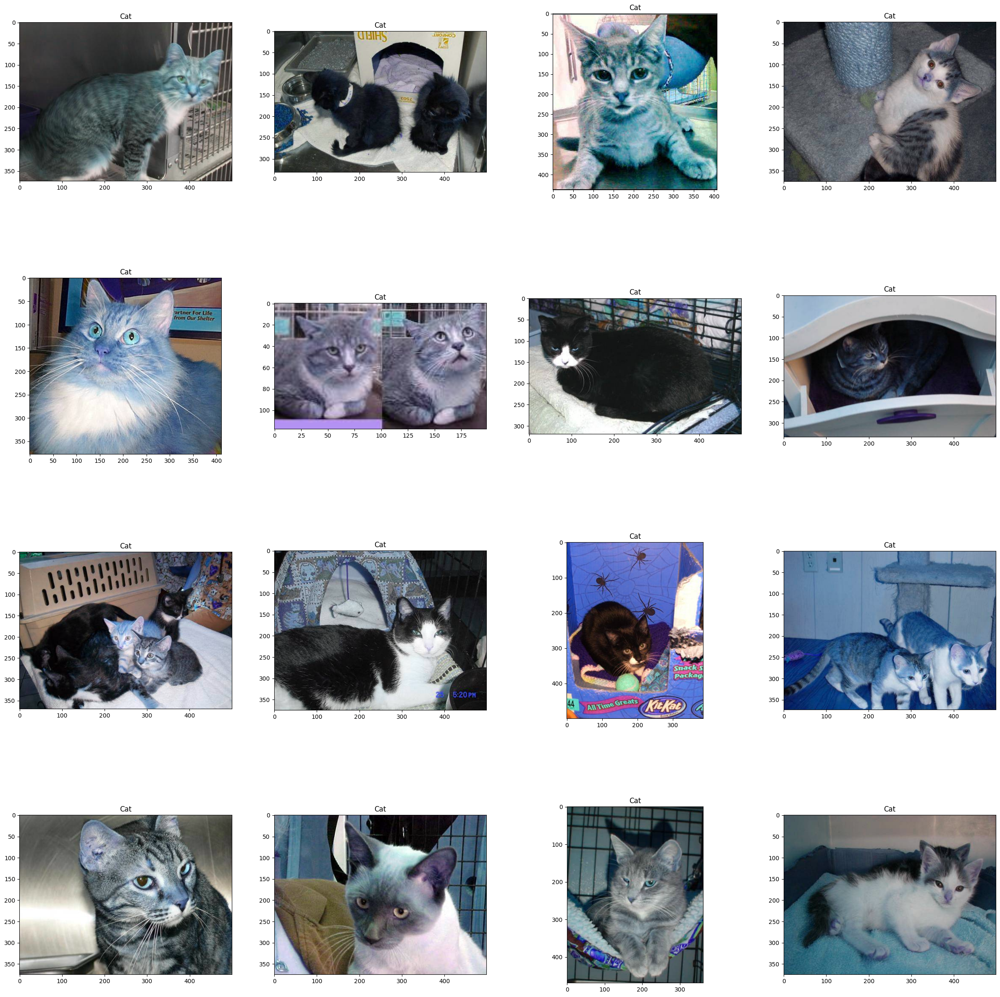

In [123]:
# Visualizing Cat data
data_visualization(training_data_path, 0)

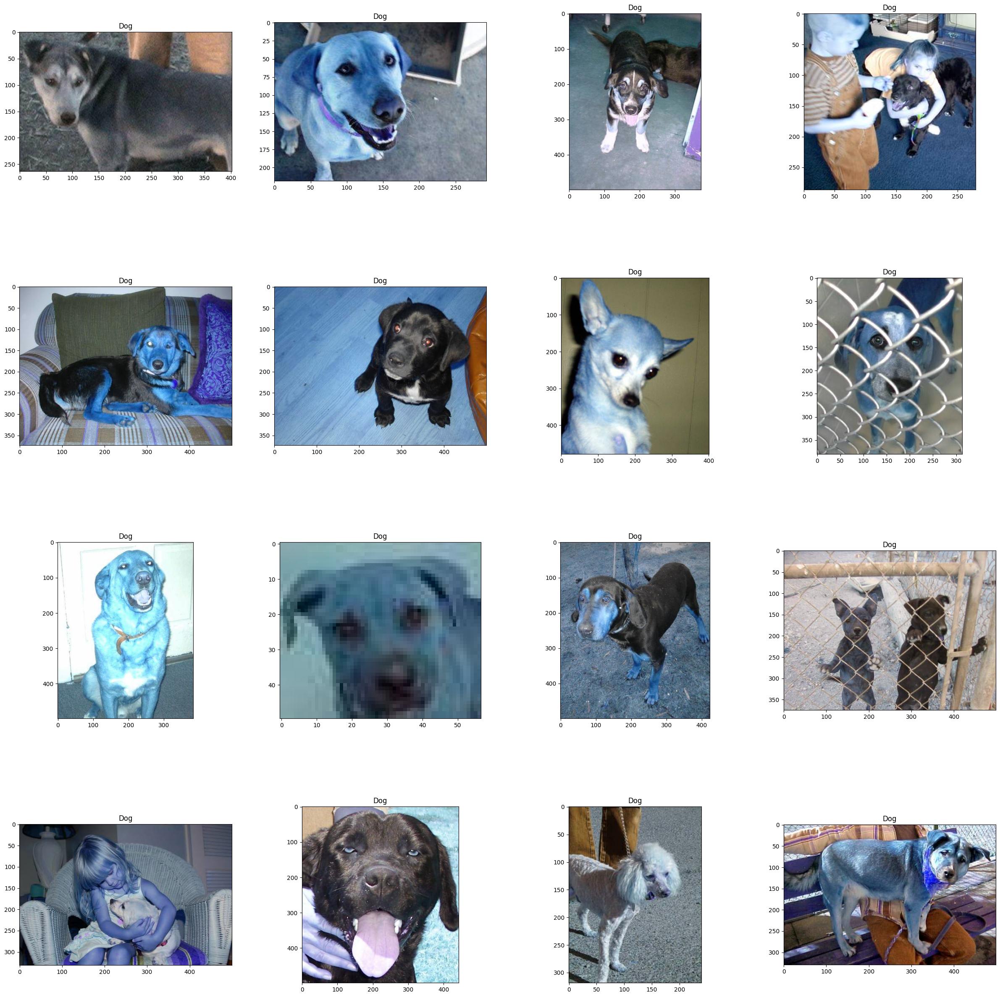

In [124]:
# Visualizing Dog data
data_visualization(training_data_path, 1)

3. Data Augmentation

In [9]:
# Data Augmentation
train_data=ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)
test_data=ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)

In [10]:
# Preparing Data for processing
train_dataset = train_data.flow_from_directory(directory=training_data_path, batch_size=32, target_size=(48,48), class_mode='binary')
test_dataset = test_data.flow_from_directory(directory=testing_data_path, batch_size=32, target_size=(48,48), class_mode='binary')

Found 8005 images belonging to 2 classes.
Found 2023 images belonging to 2 classes.


4. CNN Model Implementation

In [14]:
## Initializing CNN

classifier = Sequential()

## Apply Max pooling , normalization , dropout

# Adding 1st Convolution Layer
classifier.add(Convolution2D(filters=64, kernel_size=(3,3), strides=(1,1), input_shape=(48,48,3), activation='relu', padding='same'))
# Adding 1st MaxPooling Layer to reduce the size of feature map
classifier.add(MaxPooling2D(pool_size=(2,2), strides=(2,2) ))
# Adding 1st BatchNormalization Layer for higher Learning Rate
classifier.add(BatchNormalization())

# Adding 2nd Convolution Layer
classifier.add(Convolution2D(filters=32, kernel_size=(3,3), strides=(1,1), activation='relu', padding='same'))
classifier.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
classifier.add(BatchNormalization())
classifier.add(Dropout(0.2))

## Add flattening, Relu activation and output layer

# Adding Flatten Layer to convert 2D matrix into an array
classifier.add(Flatten())
# Adding Fully connected layer with relu activation function
classifier.add(Dense(units=32,activation='relu'))
# Adding Output Layer
classifier.add(Dense(units=1,activation='sigmoid'))

## Model Summary
print(classifier.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 48, 48, 64)        1792      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 24, 24, 64)       0         
 2D)                                                             
                                                                 
 batch_normalization_2 (Batc  (None, 24, 24, 64)       256       
 hNormalization)                                                 
                                                                 
 conv2d_3 (Conv2D)           (None, 24, 24, 32)        18464     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 12, 12, 32)       0         
 2D)                                                             
                                                      

5. Compile and train the model

In [16]:
# Compiling the CNN
classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Fitting the CNN to images
model = classifier.fit(train_dataset, epochs=55, validation_data=test_dataset, verbose = 1)

Epoch 1/55
251/251 [==============================] - 114s 443ms/step - loss: 0.1931 - accuracy: 0.9163 - val_loss: 0.9360 - val_accuracy: 0.7454
Epoch 2/55
251/251 [==============================] - 110s 439ms/step - loss: 0.1804 - accuracy: 0.9272 - val_loss: 0.7103 - val_accuracy: 0.7781
Epoch 3/55
251/251 [==============================] - 115s 459ms/step - loss: 0.1818 - accuracy: 0.9272 - val_loss: 0.7762 - val_accuracy: 0.7672
Epoch 4/55
251/251 [==============================] - 116s 460ms/step - loss: 0.1828 - accuracy: 0.9287 - val_loss: 0.6853 - val_accuracy: 0.7795
Epoch 5/55
251/251 [==============================] - 114s 456ms/step - loss: 0.1772 - accuracy: 0.9298 - val_loss: 0.7888 - val_accuracy: 0.7514
Epoch 6/55
251/251 [==============================] - 110s 437ms/step - loss: 0.1707 - accuracy: 0.9302 - val_loss: 0.6077 - val_accuracy: 0.8033
Epoch 7/55
251/251 [==============================] - 114s 453ms/step - loss: 0.1696 - accuracy: 0.9292 - val_loss: 0.6012 -

6. Save the model

In [17]:
# Saving the  model to use it later on

classifier_model = classifier.to_json()
with open("/gdrive/My Drive/unikaksha/mini_projects/Cat&Dog_Prediction/Cat&Dog_Prediction_Model.json", "w") as json_file:
    json_file.write(classifier_model)
classifier.save_weights("/gdrive/My Drive/unikaksha/mini_projects/Cat&Dog_Prediction/Cat&Dog_Prediction_Model.h5")

7. Visualization of accuracy using matplotlib

<Figure size 640x480 with 0 Axes>

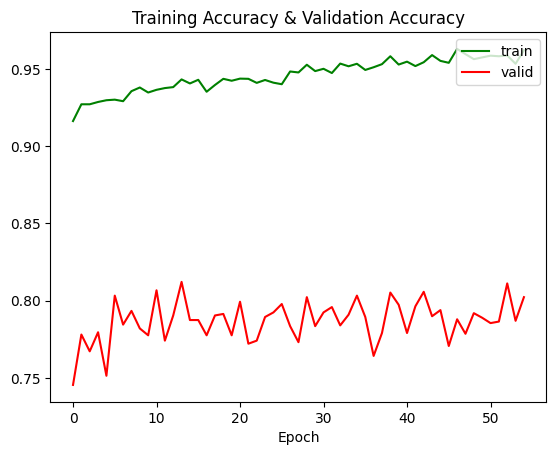

<Figure size 640x480 with 0 Axes>

In [18]:
plt.plot(model.history['accuracy'], 'green', label='Train Accuracy')
plt.plot(model.history['val_accuracy'], 'red', label='Val Accuracy')
plt.title('Training Accuracy & Validation Accuracy')
plt.xlabel('Epoch')
plt.legend(["train", "valid"], loc ="upper right")
plt.figure()

8. Visualization of loss using matplotlib

<Figure size 640x480 with 0 Axes>

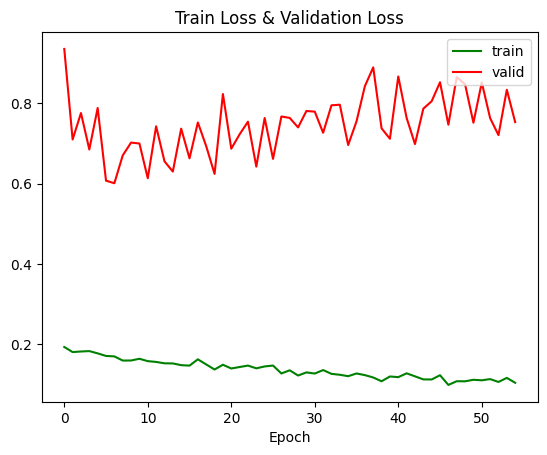

<Figure size 640x480 with 0 Axes>

In [19]:
plt.plot(model.history['loss'],'green',label='Train Loss')
plt.plot(model.history['val_loss'],'red',label='Val Loss')
plt.title('Train Loss & Validation Loss')
plt.xlabel('Epoch')
plt.legend(["train", "valid"], loc ="upper right")
plt.figure()

9. Load the model

In [62]:
#load model
model_pred = model_from_json(open("/gdrive/My Drive/unikaksha/mini_projects/Cat&Dog_Prediction/Cat&Dog_Prediction_Model.json", "r").read())
#load weights
model_pred.load_weights('/gdrive/My Drive/unikaksha/mini_projects/Cat&Dog_Prediction/Cat&Dog_Prediction_Model.h5')

10. Predict the images using model

In [110]:
def test_model(path, int_type):
  pred_label = []
  prediction_accuracy=[]
  image_name = []
  _path = path
  label = None
  predict_label = None
  if int_type == 0:
    _path = _path + "cats"
    label = 0
  else:
    _path = _path + "dogs"
    label = 1
    
  lst_img_name = os.listdir(_path)
  # print(lst_img_name)
  for i in range(len(lst_img_name)):
    # th = np.random.randint(0, len(lst_img_name) - 1)
    image_test = _path + "/" + lst_img_name[i]
    # print(image_test)
    if (image_test.endswith(".jpg")):
      # print(image_test)
      image_name.append(lst_img_name[i])
      img = cv2.imread(image_test)
      image_test = cv2.resize(img, (48,48))
      image_test = image_test.reshape(1,48,48,3)
      predictions = model_pred.predict(image_test)
      # print(predictions)
      prediction_accuracy.append(predictions[0][0])

      if label == 0:
        if predictions[0][0] > 0.5:
          pred_label.append("cat")
        else:
          pred_label.append("dog")
              
      elif label == 1:
        if predictions[0][0] > 0.5:
          pred_label.append("dog")
        else:
          pred_label.append("cat")

  return image_name, prediction_accuracy, pred_label


In [111]:
cat_predictions = test_model(testing_data_path, 0)

1/1 [==============================] - 0s 23ms/step


In [112]:
dog_predictions = test_model(testing_data_path, 1)

1/1 [==============================] - 0s 23ms/step


In [125]:
# print(cat_predictions)

In [127]:
# print(dog_predictions)

In [115]:
cat_df = pd.DataFrame(list(zip(cat_predictions[0], cat_predictions[1], cat_predictions[2])), columns =['File_Name', 'Prediction_Accuracy', 'Predicted_Label'])
cat_df.head()

,File_Name,Prediction_Accuracy,Predicted_Label
0,cat.4008.jpg,1.0,cat
1,cat.4021.jpg,1.0,cat
2,cat.4020.jpg,1.0,cat
3,cat.4016.jpg,1.0,cat
4,cat.4014.jpg,1.0,cat


In [116]:
dog_df = pd.DataFrame(list(zip(dog_predictions[0], dog_predictions[1], dog_predictions[2])), columns =['File_Name', 'Prediction_Accuracy', 'Predicted_Label'])
dog_df.head()

,File_Name,Prediction_Accuracy,Predicted_Label
0,dog.4012.jpg,1.0,dog
1,dog.4003.jpg,1.0,dog
2,dog.4032.jpg,1.0,dog
3,dog.4026.jpg,1.0,dog
4,dog.4002.jpg,1.0,dog


In [119]:
merge_df = [cat_df, dog_df]
submission_df = pd.concat(merge_df)
submission_df.head()

,File_Name,Prediction_Accuracy,Predicted_Label
0,cat.4008.jpg,1.0,cat
1,cat.4021.jpg,1.0,cat
2,cat.4020.jpg,1.0,cat
3,cat.4016.jpg,1.0,cat
4,cat.4014.jpg,1.0,cat


In [120]:
submission_df.tail()

,File_Name,Prediction_Accuracy,Predicted_Label
1007,dog.4025.jpg,1.0,dog
1008,dog.4016.jpg,1.0,dog
1009,dog.4009.jpg,1.0,dog
1010,dog.4022.jpg,1.0,dog
1011,dog.4006.jpg,1.0,dog


In [121]:
submission_df.to_csv('/gdrive/My Drive/unikaksha/mini_projects/Cat&Dog_Prediction/Submission.csv')